## Overview figures

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import sc_toolbox as sct

Running Scanpy 1.8.2, on 2025-01-22 08:46.


In [111]:
## path variables
adata_dir = '/mnt/smb/Niklas/GLPG_data_temp/240731_GLPG_annotated.h5ad'
data_dir = '/home/niklas/projects/GLPG_drug_perturbations/01_data/'
out_dir = '/home/niklas/projects/GLPG_drug_perturbations/04_annotation/04_01_data/'

In [3]:
## plotting variables
sc.settings.figdir = '/home/niklas/projects/GLPG_drug_perturbations/02_figures/fig1/'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## new adata dir
adata_dir = '/mnt/smb/Niklas/GLPG_data_temp/240811_GLPG_annotated.h5ad'

In [5]:
## load anndata object
adata = sc.read(adata_dir)

In [6]:
## have a look at the adata object: 442k cells x 25000 genes
adata

AnnData object with n_obs × n_vars = 442439 × 24500
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2', 'cell_type', 'group', 'ChromiumBatch', 'LibraryPrepBatch', 'SeqBatch', 'ashcroft_score', 'body_weight_d0', 'body_weight_d1', 'body_weight_d2', 'body_weight_d3', 'body_weight_d4', 'body_weight_d5', 'body_weight_d6', 'body_weight_d7', 'body_weight_d8', 'body_weight_d9', 'body_weight_d10', 'body_weight_d11', 'body_weight_d12', 'body_weight_d13', 'body_weight_d14', 'body_weight_d15', 'body_weight_d16', 'body_weight_d17', 'body_weight_d18', 'body_weight_d19', 'body_weight_d20', 'body_weight_d21', 'body_weight_min', 'body_weight_max', 'delta_max_body_weight', 'delta_body_weight_d7_10', 'delta_body_weight_d14_d21'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispe

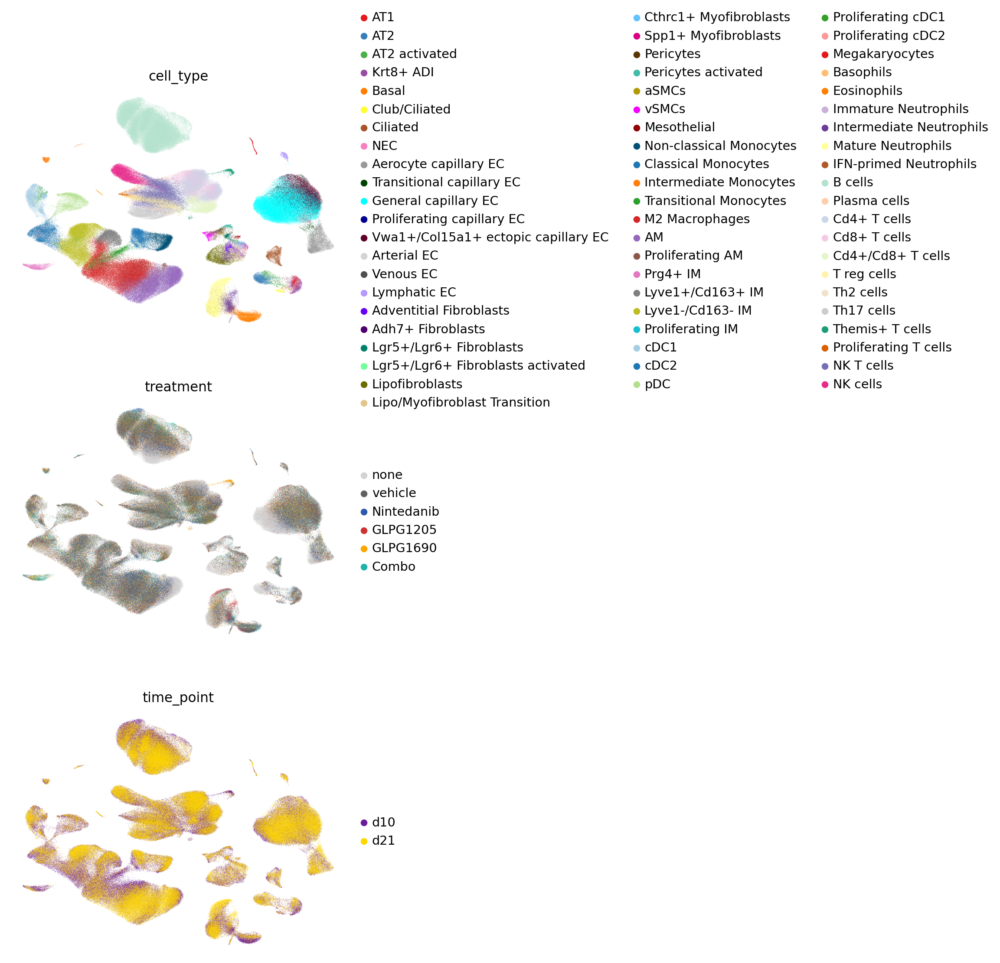

In [8]:
sc.pl.umap(adata, color = ['cell_type','treatment','time_point'], ncols = 1, frameon = False, size = 0.4)

### Compute marker genes

In [9]:
## compute marker genes
sc.tl.rank_genes_groups(adata, groupby='cell_type', method='wilcoxon')

ranking genes


/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scanpy/to

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:19:54)


In [ ]:
## function to add pct expressed 
def add_pct(adata, tab, ids, group_by, thresh_min=0, gene_label='gene'):
    for ident in ids:
        
        # subset to cell type of interest
        cells_oi = adata.obs_names[adata.obs[group_by] == ident]
        # compute fraction (%) of cell type expressing each marker genes
        data_temp_oi = pd.DataFrame(((adata[cells_oi].layers['counts'] > 0).sum(0)
                / adata[cells_oi].layers['counts'].shape[0]).T, index=adata.var_names)
        
        # subset to all other cells (background)
        cells_background = adata.obs_names[adata.obs[group_by] != ident]
        # compute fraction (%) to background expressing each marker genes
        data_temp_background = pd.DataFrame(((adata[cells_background].layers['counts'] > 0).sum(0)
                / adata[cells_background].layers['counts'].shape[0]).T, index=adata.var_names)
        
        if gene_label == 'index':
            tab[f'pct_cell_type'] = data_temp_oi.reindex(tab.index.values).values
            tab[f'pct_background'] = data_temp_background.reindex(tab.index.values).values
        else:
            tab[f'pct_cell_type'] = data_temp_oi.reindex(tab.loc[:, gene_label]).values
            tab[f'pct_background'] = data_temp_background.reindex(tab.loc[:, gene_label]).values
    return tab

In [13]:
## pandas df of all marker genes
result = adata.uns['rank_genes_groups']
marker_df = []
for cluster in result['names'].dtype.names:
    ct_table = pd.DataFrame({'gene': result['names'][cluster],
                            'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster],
                            'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster],
                            'cell_type': cluster
                           })
    ## compute pct expressed for cell type and background
    ct_table = add_pct(adata, ct_table, [cluster], group_by = 'cell_type')
    marker_df.append(ct_table)
marker_df = pd.concat(marker_df)
marker_df.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type,pct_cell_type,pct_background
0,Ager,50.736294,10.068603,0.0,0.0,AT1,0.978982,0.014760
1,Krt7,49.617073,8.902996,0.0,0.0,AT1,0.957965,0.015331
2,Emp2,49.236126,7.070123,0.0,0.0,AT1,0.967920,0.058707
3,Cldn18,48.552513,8.543477,0.0,0.0,AT1,0.941372,0.014993
4,Prdx6,47.731304,5.246322,0.0,0.0,AT1,0.959071,0.266606


In [85]:
## filter marker gene table
markers_filtered = marker_df[marker_df['logfoldchange'] > 2]
markers_filtered = marker_df[marker_df['pct_background'] < 0.1]
markers_filtered = marker_df[marker_df['pct_cell_type'] > 0.25]

In [ ]:
## save marker table
markers_filtered.to_csv(out_dir + 'GLPG_marker_table_overall.csv', sep = '\t', index = False)

In [86]:
## select only top genes per cell type

## identify the max score for each gene across all cell types
gene_max_scores = markers_filtered.groupby('gene')['score'].max().reset_index()
gene_max_scores = gene_max_scores.rename(columns={'score': 'max_score'})

## merge max score back to original df
markers_filtered = pd.merge(markers_filtered, gene_max_scores, on='gene')
## filter row where score it score == max score
top_markers = markers_filtered[markers_filtered['score'] == markers_filtered['max_score']]
## drop helper col
top_markers = top_markers.drop(columns=['max_score'])

## sort df
top_markers = top_markers.sort_values(['cell_type','logfoldchange'], ascending = [True,False])

In [87]:
top_markers.head(15)

,gene,score,logfoldchange,pval,pval_adj,cell_type,pct_cell_type,pct_background
138610,Chil3,277.065887,7.659659,0.0,0.0,AM,0.998945,0.073510
141813,Cidec,152.546906,7.366296,0.0,0.0,AM,0.528654,0.006469
141842,Krt79,114.895409,7.326513,0.0,0.0,AM,0.398616,0.004897
141863,Fabp1,93.533966,7.221179,0.0,0.0,AM,0.324699,0.003977
141877,Acaa1b,85.333717,6.930876,0.0,0.0,AM,0.296490,0.003892
141828,Gm42772,134.470108,6.834034,0.0,0.0,AM,0.466930,0.005637
141827,2900064K03Rik,134.567947,6.829798,0.0,0.0,AM,0.467293,0.005695
141861,Marco,94.360619,6.672711,0.0,0.0,AM,0.328390,0.004436
141873,Cpne5,89.871826,6.382236,0.0,0.0,AM,0.313264,0.005011
98826,Plet1,271.700562,6.118153,0.0,0.0,AM,0.964805,0.053313


In [ ]:
## save marker table
top_markers.to_csv(out_dir + 'GLPG_marker_table_overall_TOP_unique_genes.csv', sep = '\t', index = False)

In [101]:
## generate dict with top 5 markers
top_genes_dict = (
    top_markers.sort_values(by='logfoldchange', ascending=False)
    .groupby('cell_type')
    .apply(lambda x: list(x.nlargest(5, 'logfoldchange')['gene']))
    .to_dict()
)

In [114]:
## visualize top marker genes as dotplot
sc.pl.dotplot(adata,
              top_genes_dict,
              groupby = 'cell_type',
              standard_scale = 'var',
              cmap = 'Reds',
              dendrogram=True,
              save= 'top_auto_markers.pdf')

In [112]:
sc.pl.heatmap(adata,
              top_genes_dict,
              groupby = 'cell_type',
              standard_scale = 'var',
              vmin=-2,
              vmax=2,
              cmap='RdBu_r',
              dendrogram=True,
              show_gene_labels = True,
              #swap_axes=True,
              figsize=(64, 256)
)

In [113]:
sc.pl.matrixplot(adata,
                 top_genes_dict,
                 groupby = 'cell_type',
                 standard_scale = 'var',
                 cmap = 'viridis',
                 dendrogram=True,
                 save= 'top_auto_markers.pdf')

### Eosinophil marker gene analysis

In [ ]:
markers_filtered.drop(['max_score'], axis=1, inplace = True)

In [131]:
granulocyte_list = ['Eosinophils',
                    'Intermediate Neutrophils',
                    'Mature Neutrophils',
                    'Immature Neutrophils',
                    'IFN-primed Neutrophils',
                    'Basophils']
granulocyte_markers = markers_filtered[markers_filtered['cell_type'].isin(granulocyte_list)]

In [132]:
## identify the max score for each gene across all cell types
gene_max_scores = granulocyte_markers.groupby('gene')['score'].max().reset_index()
gene_max_scores = gene_max_scores.rename(columns={'score': 'max_score'})

In [133]:
## merge max score back to original df
granulocyte_markers = pd.merge(granulocyte_markers, gene_max_scores, on='gene')
## filter row where score it score == max score
top_granulocyte_markers = granulocyte_markers[granulocyte_markers['score'] == granulocyte_markers['max_score']]
## drop helper col
top_granulocyte_markers = top_granulocyte_markers.drop(columns=['max_score'])

In [134]:
## sort df
top_granulocyte_markers = top_granulocyte_markers.sort_values(['cell_type','logfoldchange'], ascending = [True, False])

In [139]:
## select top10 markers for each cell type
top_genes_dict = (
    top_granulocyte_markers.sort_values(by='logfoldchange', ascending=False)
    .groupby('cell_type')
    .apply(lambda x: list(x.nlargest(10, 'logfoldchange')['gene']))
    .to_dict()
)

In [140]:
sc.settings.figdir = '/home/niklas/projects/GLPG_drug_perturbations/02_figures/fig4/'

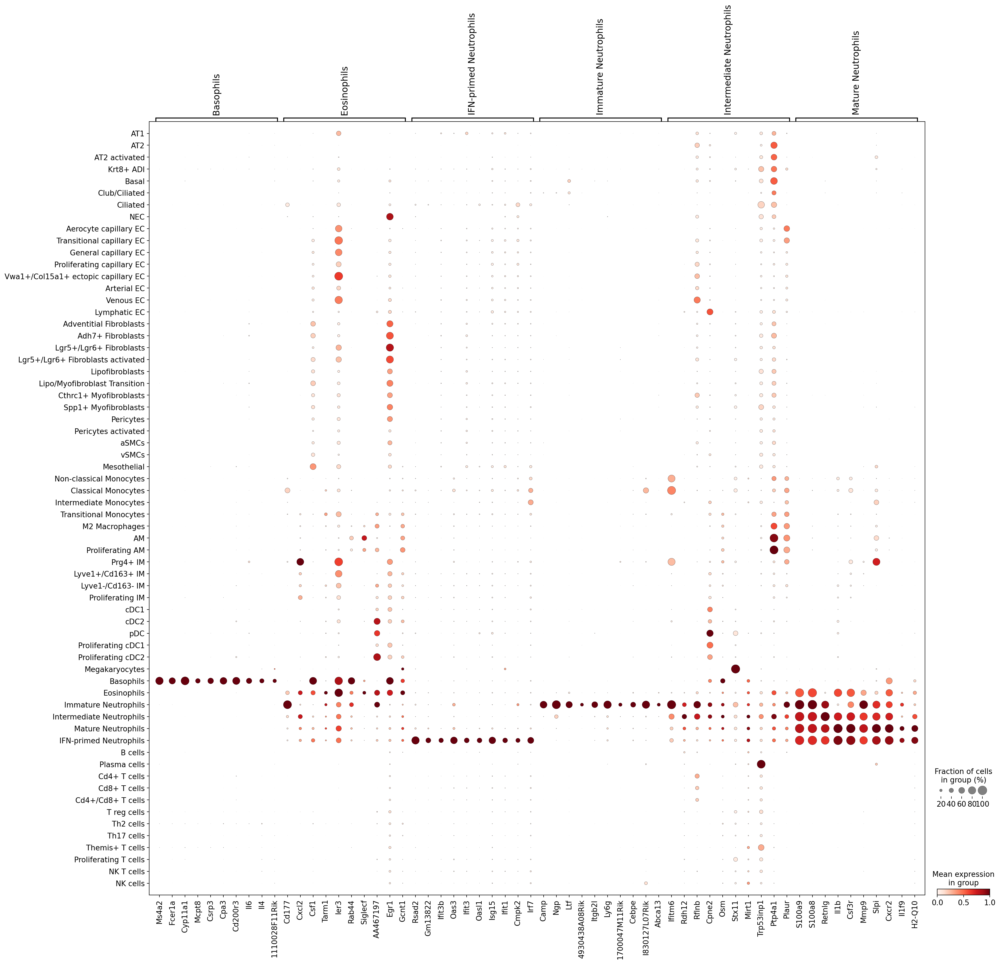

In [141]:
## visualize some eosinophil marker genes
sc.pl.dotplot(adata,
              groupby = 'cell_type',
              var_names = top_genes_dict,
              standard_scale = 'var',
              cmap = 'Reds',
              save = 'top_granulocyte_markers.pdf'
             )